We will use [Womens Clothing E-Commerce Reviews data set](https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews), and try to explore and visualize as much as we can.

### Download the data

In [1]:
url = 'https://storage.googleapis.com/kaggle-data-sets/11827/16290/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1570161012&Signature=qvL%2BuowNN7U4kcN0gLzsbxeKyqc9IWeoVX2QTHTth3QzibFBpq4B%2BHtwroWTcwbcRDbr75Bg772Orf8zGaQLd1KYWprXUXSsouQ26emmzlpV6LLQcmV6wOFrZhW5QiWABsFgVR3ghnx7ofgvGZEShkT3tCEBX%2Bmntfib4iAOLOcs9YTMjW9eKwm2GnnC3v4omG2B4T3AjdNXLBt2h2n4XQj%2B%2FyCmo3uhyUUMA9gzA%2FZHX00v8VFsV8G7RbG2458mR6h%2FXeWjoLJrcGU2ULGPyRxsYOIn%2Bg29XJwmgjlzhz1cX3goru6cWQ1%2Fnfmu2eIY0mr%2FUZlu6RCus1jwa3hJ1w%3D%3D&response-content-disposition=attachment%3B+filename%3Dwomens-ecommerce-clothing-reviews.zip'

import os
if not os.path.exists('data'):
    os.makedirs('data')
    
import urllib.request

urllib.request.urlretrieve(url, 'data/womens-ecommerce-clothing-reviews.zip')

# unzip file
import zipfile
with zipfile.ZipFile('data/womens-ecommerce-clothing-reviews.zip', 'r') as zip_ref:
    zip_ref.extractall('data/')
    
import glob

glob.glob('data/*')

['data/amazon-unlocked-mobilecsv.zip',
 'data/cached_review.csv',
 'data/Womens Clothing E-Commerce Reviews.csv',
 'data/Amazon_Unlocked_Mobile.csv',
 'data/womens-ecommerce-clothing-reviews.zip',
 'data/loan_predict']

### Data cleaning

In [2]:
# Load the data
import pandas as pd

df = pd.read_csv('data/Womens Clothing E-Commerce Reviews.csv')
df.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


We can see the solumn names is quite messy (Uppercase and space, gez). Also, the column `Unnamed`seems to be redundant. Let's fix this

In [3]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')
df = df.drop(['unnamed:_0'], axis=1)
df.head()

,clothing_id,age,title,review_text,rating,recommended_ind,positive_feedback_count,division_name,department_name,class_name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [4]:
df.describe(), df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 10 columns):
clothing_id                23486 non-null int64
age                        23486 non-null int64
title                      19676 non-null object
review_text                22641 non-null object
rating                     23486 non-null int64
recommended_ind            23486 non-null int64
positive_feedback_count    23486 non-null int64
division_name              23472 non-null object
department_name            23472 non-null object
class_name                 23472 non-null object
dtypes: int64(5), object(5)
memory usage: 1.8+ MB


(        clothing_id           age        rating  recommended_ind  \
 count  23486.000000  23486.000000  23486.000000     23486.000000   
 mean     918.118709     43.198544      4.196032         0.822362   
 std      203.298980     12.279544      1.110031         0.382216   
 min        0.000000     18.000000      1.000000         0.000000   
 25%      861.000000     34.000000      4.000000         1.000000   
 50%      936.000000     41.000000      5.000000         1.000000   
 75%     1078.000000     52.000000      5.000000         1.000000   
 max     1205.000000     99.000000      5.000000         1.000000   
 
        positive_feedback_count  
 count             23486.000000  
 mean                  2.535936  
 std                   5.702202  
 min                   0.000000  
 25%                   0.000000  
 50%                   1.000000  
 75%                   3.000000  
 max                 122.000000  , None)

We can see there are some missing values in column `Title` and `Review Text`. We also see some people at the age of 99 give some feedback. This could be an error in the data. Let's check how many percent of the data is missing.

In [5]:
import numpy as np

np.mean(df.title.isnull()), np.mean(df.review_text.isnull())

(0.1622243038405859, 0.035978881035510515)

Around 16% of the title and 3.5% of the reivew text are missing. For now we will drop the title and drop the misisng value in review text column.

In [6]:
df = df.drop(['title'], axis=1)
df = df.dropna()

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22628 entries, 0 to 23485
Data columns (total 9 columns):
clothing_id                22628 non-null int64
age                        22628 non-null int64
review_text                22628 non-null object
rating                     22628 non-null int64
recommended_ind            22628 non-null int64
positive_feedback_count    22628 non-null int64
division_name              22628 non-null object
department_name            22628 non-null object
class_name                 22628 non-null object
dtypes: int64(5), object(4)
memory usage: 1.7+ MB


In [7]:
# Let's inspect the review text, we might need to clean it up
et = df.review_text.sample(10).values
for t in et:
    print(t)
    print('--------------')

Great shirt! i am a tshirt wearing girl so i like to have a lot of different styles. this is more than a tshirt- great style and thicker than expected. great fit, overall love it
--------------
For reference: 5'3, 130#, athletic/muscular body type (broad shoulders, slim hips)
i bought my usual size 4 and it fit perfectly. like other reviewers said, this is a very fine corduroy fabric. the thicker fabric really helps smooth any bumps and bulges, and the a-line skirt was flattering. overall i liked this dress, but the color didn't do much for me. because it just wasn't "wow" on me, i found little things to nitpick. the bodice is very flattering, but the way it cuts in shows bra-straps (
--------------
The dress is a great buy especially since it was on sale. it fits like his other dresses flattering as i don't have a big bust and have a bit of extra skin from pregnancies but with this dress i feel amazing. get a ton of compliments when i wear it!
--------------
The smallest size, xs, was

**Steps fo cleaning text data**

1. Escaping HTML characters: Data obtained from web usually contains a lot of html entities like &lt; &gt; &amp; which gets embedded in the original data. It is thus necessary to get rid of these entities. One approach is to directly remove them by the use of specific regular expressions. Another approach is to use appropriate packages and modules (for example htmlparser of Python), which can convert these entities to standard html tags. For example: &lt; is converted to “<” and &amp; is converted to “&”.

In [8]:
from html.parser import HTMLParser

def html_unescape(review_text):
    html_parser = HTMLParser()
    review_text = review_text.map(lambda x: html_parser.unescape(x))
    return review_text

2. Decoding data: This is the process of transforming information from complex symbols to simple and easier to understand characters. Text data may be subject to different forms of decoding like “Latin”, “UTF8” etc. Therefore, for better analysis, it is necessary to keep the complete data in standard encoding format. UTF-8 encoding is widely accepted and is recommended to use.

In [9]:
def ascii_decode(review_text):
    review_text = review_text.str.decode(encoding = 'UTF-8')
    review_text = review_text.str.encode(encoding = 'ascii', errors = 'ignore')
    return review_text

3. Apostrophe Lookup: To avoid any word sense disambiguation in text, it is recommended to maintain proper structure in it and to abide by the rules of context free grammar. When apostrophes are used, chances of disambiguation increases.

For example “it’s is a contraction for it is or it has”.

All the apostrophes should be converted into standard lexicons. One can use a lookup table of all possible keys to get rid of disambiguates but there is a python package that does this: `pycontractions`

In [10]:
!pip install pycontractions

     |████████████████████████████████| 24.7MB 407kB/s eta 0:00:01
  Using cached https://files.pythonhosted.org/packages/23/10/c0b78c27298029e4454a472a1919bde20cb182dab1662cec7f2ca1dcc523/boto-2.49.0-py2.py3-none-any.whl
     |████████████████████████████████| 133kB 17.7MB/s eta 0:00:01
     |████████████████████████████████| 5.7MB 7.1MB/s eta 0:00:01
  Using cached https://files.pythonhosted.org/packages/16/8a/1fc3dba0c4923c2a76e1ff0d52b305c44606da63f718d14d3231e21c51b0/s3transfer-0.2.1-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/83/94/7179c3832a6d45b266ddb2aac329e101367fbdb11f425f13771d27f225bb/jmespath-0.9.4-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/22/cd/a6aa959dca619918ccb55023b4cb151949c64d4d5d55b3f4ffd7eee0c6e8/docutils-0.15.2-py3-none-any.whl


In [11]:
from pycontractions import Contractions

cont = Contractions(api_key="glove-twitter-100")

# optional, prevents loading on first expand_texts call
cont.load_models()

def text_expansion(review_text):
    review_text = review_text.map(lambda x: list(cont.expand_texts([x], precise=True))[0])
    return review_text


4. Removal of Stop-words: When data analysis needs to be data driven at the word level, the commonly occurring words (stop-words) should be removed. One can either create a long list of stop-words or one can use predefined language specific libraries.
5. Removal of Punctuations: All the punctuation marks according to the priorities should be dealt with. For example: “.”, “,”,”?” are important punctuations that should be retained while others need to be removed.
6. Removal of Expressions: Textual data (usually speech transcripts) may contain human expressions like [laughing], [Crying], [Audience paused]. These expressions are usually non relevant to content of the speech and hence need to be removed. Simple regular expression can be useful in this case.
7. Split Attached Words: We humans in the social forums generate text data, which is completely informal in nature. Most of the tweets are accompanied with multiple attached words like RainyDay, PlayingInTheCold etc. These entities can be split into their normal forms using simple rules and regex.
8. Slangs lookup: Again, social media comprises of a majority of slang words. These words should be transformed into standard words to make free text. The words like luv will be converted to love, Helo to Hello. The similar approach of apostrophe look up can be used to convert slangs to standard words. A number of sources are available on the web, which provides lists of all possible slangs, this would be your holy grail and you could use them as lookup dictionaries for conversion purposes.
9. Standardizing words: Sometimes words are not in proper formats. For example: “I looooveee you” should be “I love you”. Simple rules and regular expressions can help solve these cases.
10. Removal of URLs: URLs and hyperlinks in text data like comments, reviews, and tweets should be removed.

We won't do any of these here

In [12]:
# Clean the review text
def preprocess(ReviewText):
    ReviewText = html_unescape(ReviewText)
    #ReviewText = ascii_decode(ReviewText)
    ReviewText = text_expansion(ReviewText)
 
    return ReviewText

if not os.path.exists('data/cached_review.csv'):
    df.review_text = preprocess(df.review_text)
    df.to_csv('data/cached_review.csv')
else:
    df = pd.read_csv('data/cached_review.csv')

In [13]:
# convert all text to lower case
df.review_text = df.review_text.str.lower()

**Advanced data cleaning:**

1. Grammar checking: Grammar checking is majorly learning based, huge amount of proper text data is learned and models are created for the purpose of grammar correction. There are many online tools that are available for grammar correction purposes.
2. Spelling correction: In natural language, misspelled errors are encountered. Companies like Google and Microsoft have achieved a decent accuracy level in automated spell correction. One can use algorithms like the Levenshtein Distances, Dictionary Lookup etc. or other modules and packages to fix these errors.

We do not do these here.

### Single variable inspection
#### Distribution of the ratings

In [14]:
%matplotlib inline
from plotly.offline import init_notebook_mode, iplot 
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

df['rating'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

So most of the ratings are pretty high at 4 or 5.
#### Age's distribution

In [15]:
df.age.iplot(
    kind='violin',
    title='Reviewers age Distribution')

#### Word count distribution

In [16]:
df['word_count'] = df.review_text.apply(lambda x: len(str(x).split()))

df.word_count.iplot(
    kind='hist',
    bins = 100,
    xTitle='number of word',
    linecolor='black',
    yTitle='count',
    title='Review Word Count Distribution')

#### The distribution of division

In [17]:
df.groupby('division_name').count()['clothing_id'].iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Division Name', xTitle='Division Name')

In [18]:
# We can achieve the same plot with this
df.division_name.iplot(
    kind='hist',
    xTitle='Division',
    yTitle='Number of review',
    title='Review per division Distribution')

#### The distribution of department

In [19]:
df.groupby('department_name').count()['clothing_id'].sort_values(ascending=False).iplot(kind='bar', yTitle='Count', linecolor='black', opacity=0.8,
                                                           title='Bar chart of Department Name', xTitle='Department Name')

#### The distribution of top unigrams before and after removing stop words

The stop words does not carry much information, so let's see the effect of removing them from the text

In [20]:
# !pip install sklearn
from sklearn.feature_extraction.text import CountVectorizer

def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df['review_text'], 20)

df1 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df1.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in review before removing stop words')


We can see the top word is 'the' which is not a good feature indicating sentiment of the text. Now try again with stop words removed

In [21]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df['review_text'], 20)

df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 words in review after removing stop words')


Now we see some words with rich information in the list like: like, love, comfortable, perfect, etc. Now try bi-gram

#### The distribution of top bigrams before and after removing stop words

In [22]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['review_text'], 20)

df3 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
#df3.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
#    kind='bar', yTitle='Count', linecolor='black', title='Top 20 bigrams in review before removing stop words')

df3.iplot(
    kind='bar', x = 'ReviewText', y = 'count', yTitle='Count', linecolor='black', title='Top 20 bigrams in review before removing stop words')

Still, not much information form the bi-grams on the list

In [23]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['review_text'], 20)

df4 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df4.iplot(
    kind='bar', x = 'ReviewText', y = 'count', yTitle='Count', linecolor='black', title='Top 20 bigrams in review before removing stop words')

We can see removing stop words has significant effect on predicting the sentiment of the text.

#### The distribution of top part-of-speech tags of review corpus

In [26]:
!pip install textblob
from textblob import TextBlob

blob = TextBlob(' '.join(df['review_text'].values))
pos_df = pd.DataFrame(blob.tags, columns = ['word' , 'pos'])
pos_df = pos_df.pos.value_counts()[:20]

pos_df.iplot(
    kind='bar',
    xTitle='POS',
    yTitle='count', 
    title='Top 20 Part-of-speech tagging for review corpus')

#### Scatter matrix

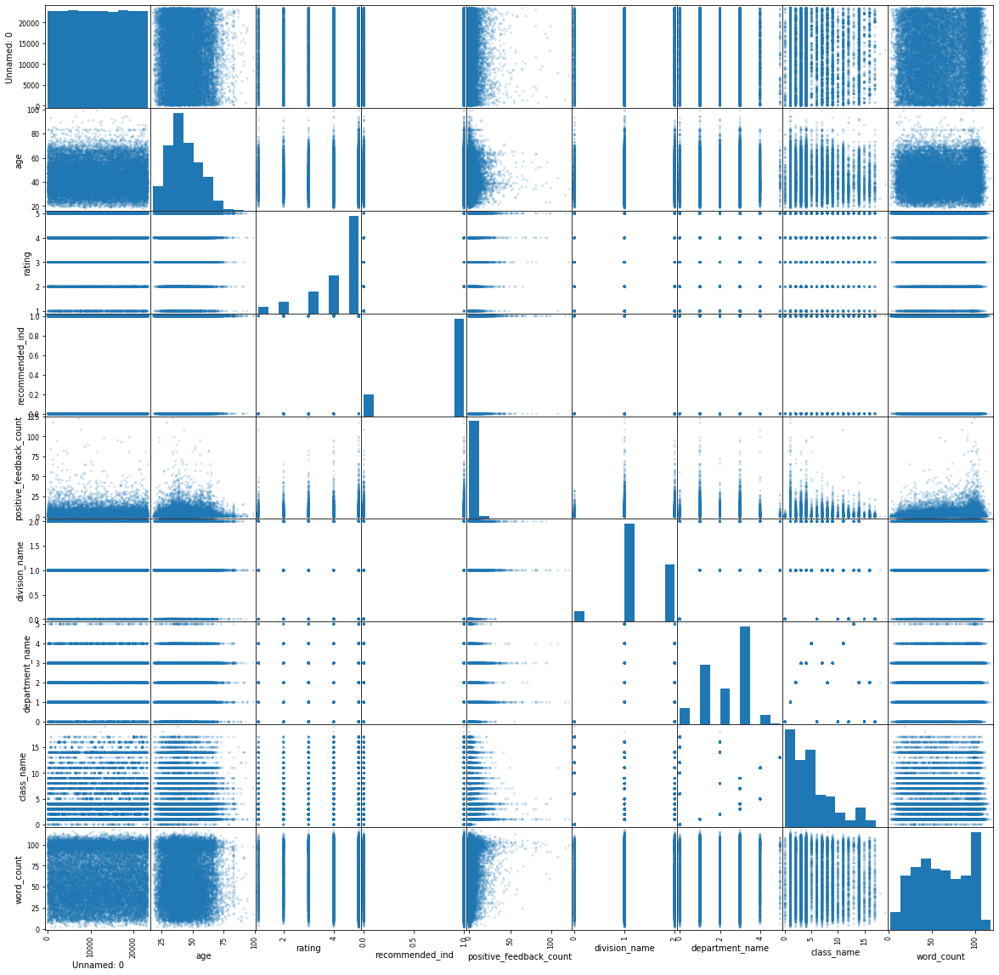

In [27]:
ndf = df.drop(['review_text', 'clothing_id'], axis=1)
for col in ['division_name', 'department_name', 'class_name']:
     ndf[col] = pd.Categorical(ndf[col], categories=ndf[col].unique()).codes
pd.plotting.scatter_matrix(ndf, alpha=0.2, figsize = (20, 20))

print()

It's really hard to see if there is any correlation between rating and other variable

### Bivariate visualization
#### What do the departments tell about rating

In [28]:
#we will get help from pivot tables to get Fare values in different columns for each class.
df[['rating', 'department_name']].pivot(columns='department_name', values='rating').iplot(kind='box')

Except Trend department, all the other departments’ median rating were 5. Overall, the ratings are high in this review data set.

#### Rating and recomandation

In [29]:
df[["rating","recommended_ind"]].pivot(columns='recommended_ind', values='rating').iplot(kind="hist", bins=20, theme="white", title="Rating distribution over recommendation",
         xTitle='Rating', yTitle='Count')

It's quite obvious that people who gives high rating tend to give recommendation to others.

#### Word count vs recommendation

In [30]:
df[['word_count', 'recommended_ind']].pivot(columns='recommended_ind', values='word_count').iplot(kind='hist', barmode = 'group')

So the distributions of word count are quite similar for both group. What about word_count vs rating then?

#### Word count vs rating

In [31]:
df[['word_count', 'rating']].pivot(columns='rating', values='word_count').iplot(kind='box')

We can see word count is not a good indicator for rating.

#### Sentiment polarity

We can use `TextBlob` estimate the sentiment of a piece of text. Let's extract this feature and see if it is consistent with ratings.

In [32]:
#!pip install TextBlob
# extract the sentiment polarity using TextBlob
from textblob import TextBlob

df['polarity'] = df.review_text.map(lambda text: TextBlob(text).sentiment.polarity)

In [33]:
# polarity distribution
df['polarity'].iplot(kind = 'hist')

So most of the review have positive sentiment (>0). Let's see some review with extreme polarity.

In [34]:
# most positive reviews
cl = df.loc[df.polarity == 1, ['review_text']].sample(3).values
for c in cl:
    print(c[0])

beautiful blend of colors and the texture of the shirt is so soft...perfect fall weather garment!
perfect! cannot believe how inexpensive this is for the look. it looks just like it does on the model. i cannot wait to wear it on my vacation.
dress is awesome and makes you look skinnier.


In [35]:
# most negative reviews
cl = df.loc[df.polarity < -0.8, ['review_text']].sample(3).values
for c in cl:
    print(c[0])

cut out design, no seems or hems.
 very disappointed in retailer
awful color, horribly wrinkled and just a mess...so disappointed
received this product with a gaping hole in it. very disappointed in the quality and the quality control at the warehouse


In [36]:
# some neutral reviews
cl = df.loc[df.polarity ==0 , ['review_text']].sample(3).values
for c in cl:
    print(c[0])

i agree that this shirt is boxy and has no shape; it does not look at all like it does on the model. i returned it.
the fabric is too sheer, also looks like sleepwear. just not my thing.
i had ordered another retailer suit awhile back in an xl because my usual lg was not available, and let us say i was swimming in the xl, much to big. so when this suit came up for sale i snatched it up in lg. when i compare the two, the lg is over 4inches smaller than the xl, seems like quite a big jump in the sizing. the suit fits in the body quite well, however it is a bit snug in the side bust area. strangely, the suit has boning on the side of the bust, and also the silicone grip on the top edge,


In [37]:
import plotly.figure_factory as ff

import numpy as np

colorscale = ['#7A4579', '#D56073', 'rgb(236,158,105)', (1, 1, 0.2), (0.98,0.98,0.98)]

fig = ff.create_2d_density(
    df.rating, df.polarity, colorscale=colorscale,
    hist_color='rgb(255, 237, 222)', point_size=1
)

fig.show()

We can see there is some correlation between ratings and polarity here, which makes sense.

#### Popular terms in each rating

In [39]:
!pip install scattertext
!pip install spacy
! python -m spacy download en_core_web_md
!python -m spacy info en_core_web_md

import spacy
import en_core_web_md
import scattertext as st

nlp = spacy.load('en_core_web_md')

corpus = st.CorpusFromPandas(df, category_col='rating', text_col='review_text', nlp=nlp).build()

# Following are the terms that differentiate the review text from a general English corpus.
print(list(corpus.get_scaled_f_scores_vs_background().index[:10]))

  Using cached https://files.pythonhosted.org/packages/7c/6e/6bb9543a8a817bae2d268381b88e0520c7467e6af453eeae31a555756fa4/scattertext-0.0.2.52-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/05/d2/f94e68be6b17f46d2c353564da56e6fb89ef09faeeff3313a046cb810ca9/mock-3.0.5-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/b5/b8/50f9b86bbd87b1de961f439c2b93dfc41dd0cb9d65f6b7d824b287b50b21/statsmodels-0.10.1-cp37-cp37m-macosx_10_6_intel.macosx_10_9_intel.macosx_10_9_x86_64.macosx_10_10_intel.macosx_10_10_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/ea/0c/5f61f1a3d4385d6bf83b83ea495068857ff8dfb89e74824c6e9eb63286d8/patsy-0.5.1-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/9a/2a/057bca697905031a6179227278a49fe9e7841a6d444bc2e13f1266b9f7dc/spacy-2.1.8-cp37-cp37m-macosx_10_6_intel.macosx_10_9_intel.macosx_10_9_x86_64.macosx_10_10_intel.macosx_10_10_x86_64.whl
  Using cached https://files.pythonhos

/Volumes/Data/ethan/.env_tf20_p37/lib/python3.7/site-packages/scattertext/TermDocMatrixWithoutCategories.py:154: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated



['flattering', 'sweater', 'boxy', 'flowy', 'leggings', 'xs', 'waist', 'dress', 'blouse', 'comfy']


Let's see the if there is any different between ratings

In [40]:
df1 = df.copy()

df1.rating = df.rating.astype('str')

corpus = st.CorpusFromPandas(df1, category_col='rating', text_col='review_text', nlp=nlp).build()
term_freq_df = corpus.get_term_freq_df()

In [41]:
term_freq_df['5_star'] = corpus.get_scaled_f_scores('5')
print(list(term_freq_df.sort_values(by='5_star', ascending=False).index[:10]))

term_freq_df['1_star'] = corpus.get_scaled_f_scores('1')
print(list(term_freq_df.sort_values(by='1_star', ascending=False).index[:10]))

['is perfect', 'compliments', 'highly', 'dressed', 'perfectly', 'fits perfectly', 'perfect', 'favorite', 'glad', 'up or']
['awful', 'terrible', 'poor', 'cheap', 'nothing like', 'so disappointed', 'very disappointed', 'thin and', 'money', 'disappointing']
